In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


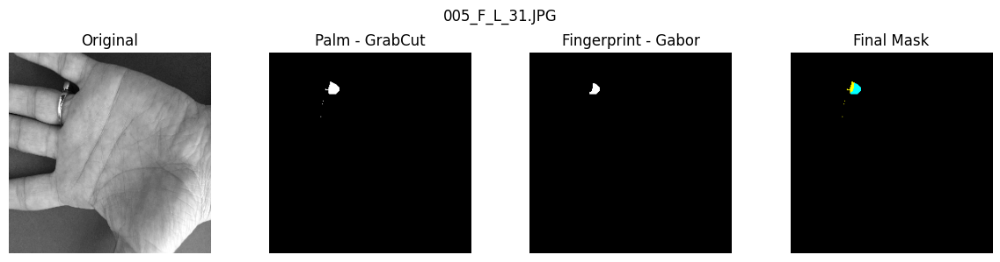

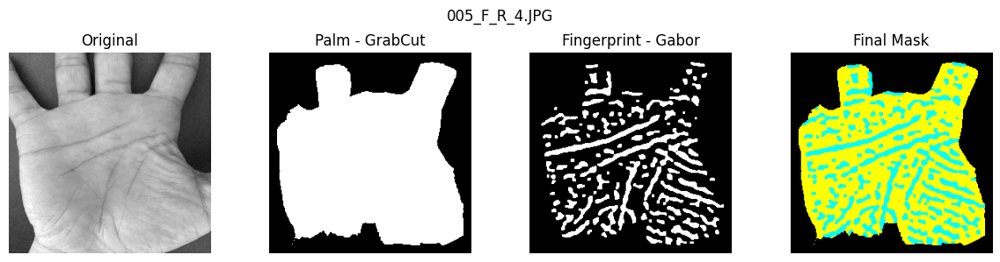

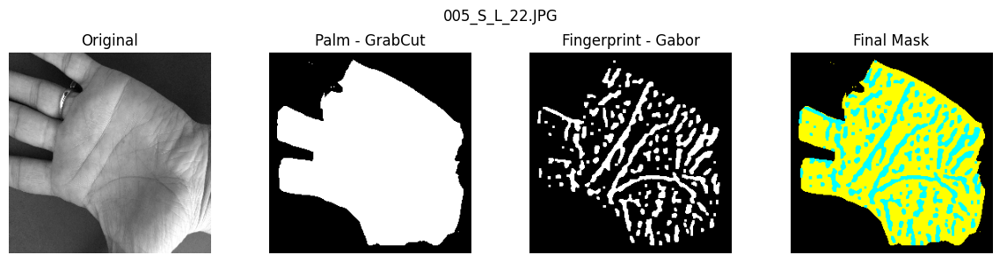

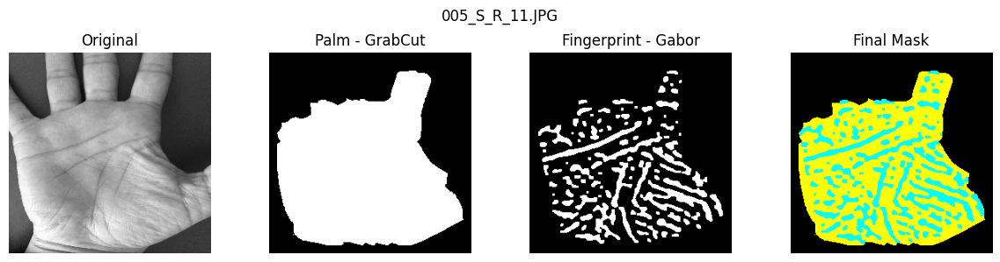

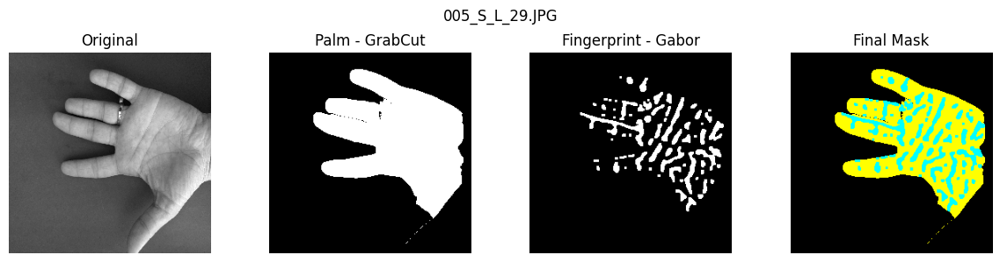

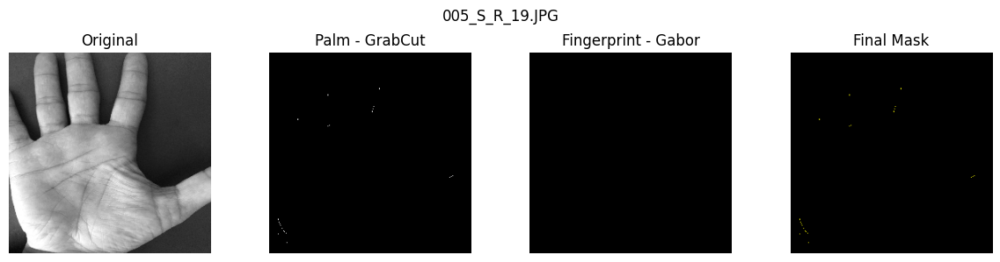

In [ ]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap

def apply_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(img)

def apply_gabor_filter(img):
    gabor_sum = np.zeros_like(img, dtype=np.float32)
    for theta in np.arange(0, np.pi, np.pi / 6):  # 6 orientations
        kernel = cv2.getGaborKernel((21, 21), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        filtered = cv2.filter2D(img, cv2.CV_32F, kernel)
        gabor_sum += np.abs(filtered)
    gabor_norm = cv2.normalize(gabor_sum, None, 0, 255, cv2.NORM_MINMAX)
    return gabor_norm.astype(np.uint8)

def extract_palm_grabcut(img_color):
    mask = np.zeros(img_color.shape[:2], np.uint8)
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    rect = (10, 10, img_color.shape[1] - 20, img_color.shape[0] - 20)
    cv2.grabCut(img_color, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    result = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8') * 255
    return result

def fingerprint_from_gabor(gabor_img, palm_mask):
    blur = cv2.GaussianBlur(gabor_img, (3, 3), 0)
    thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY_INV, 15, 7)
    masked_fp = cv2.bitwise_and(thresh, palm_mask)
    kernel = np.ones((3, 3), np.uint8)
    cleaned = cv2.morphologyEx(masked_fp, cv2.MORPH_OPEN, kernel)
    return cleaned

def create_final_mask(palm_mask, fingerprint_mask):
    final = np.zeros_like(palm_mask, dtype=np.uint8)
    final[palm_mask == 255] = 1
    final[(palm_mask == 255) & (fingerprint_mask == 255)] = 2
    return final

def visualize_all(img, palm_mask, fingerprint_mask, final_mask, fname):
    cmap = ListedColormap(['black', 'yellow', 'cyan'])

    plt.figure(figsize=(12, 3))
    plt.subplot(1, 4, 1)
    plt.title("Original")
    plt.imshow(img, cmap='gray')
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.title("Palm - GrabCut")
    plt.imshow(palm_mask, cmap='gray')
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.title("Fingerprint - Gabor")
    plt.imshow(fingerprint_mask, cmap='gray')
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.title("Final Mask")
    plt.imshow(final_mask, cmap=cmap, vmin=0, vmax=2)
    plt.axis("off")

    plt.suptitle(fname)
    plt.tight_layout()
    plt.show()

# Paths
input_path = "/content/drive/MyDrive/005"
output_path = "/content/drive/MyDrive/005/mask_gabor"
os.makedirs(output_path, exist_ok=True)

# Run loop
for filename in os.listdir(input_path):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")) and "_mask" not in filename:
        path = os.path.join(input_path, filename)
        img_gray = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        if img_gray is None:
            continue

        img_gray = cv2.resize(img_gray, (256, 256))
        img_color = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)

        clahe_img = apply_clahe(img_gray)
        gabor_img = apply_gabor_filter(clahe_img)
        palm_mask = extract_palm_grabcut(img_color)
        fingerprint_mask = fingerprint_from_gabor(gabor_img, palm_mask)
        final_mask = create_final_mask(palm_mask, fingerprint_mask)

        # Save final mask
        out_name = filename.split('.')[0] + "_gabor_mask.png"
        cv2.imwrite(os.path.join(output_path, out_name), final_mask)

        # Show visual on a few
        if np.random.rand() < 0.2:
            visualize_all(img_gray, palm_mask, fingerprint_mask, final_mask, filename)


🔄 Loading combined dataset...
📁 Loading from: /content/drive/MyDrive/001
📁 Loading from: /content/drive/MyDrive/002
📁 Loading from: /content/drive/MyDrive/003
📁 Loading from: /content/drive/MyDrive/004
📦 Loaded total 160 images and 160 masks
🔧 Building model...
🚀 Training model...
Epoch 1/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.5014 - loss: 1.8626

36/36 ━━━━━━━━━━━━━━━━━━━━ 34s 320ms/step - accuracy: 0.5031 - loss: 1.8586 - val_accuracy: 0.6047 - val_loss: 1.7081
Epoch 2/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - accuracy: 0.6668 - loss: 1.4645

36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - accuracy: 0.6669 - loss: 1.4645 - val_accuracy: 0.6047 - val_loss: 1.6381
Epoch 3/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step - accuracy: 0.6803 - loss: 1.3933 - val_accuracy: 0.6047 - val_loss: 1.7521
Epoch 4/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7046 - loss: 1.3193

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - accuracy: 0.7045 - loss: 1.3199 - val_accuracy: 0.6026 - val_loss: 1.5222
Epoch 5/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7045 - loss: 1.3404

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - accuracy: 0.7048 - loss: 1.3396 - val_accuracy: 0.5996 - val_loss: 1.4770
Epoch 6/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 218ms/step - accuracy: 0.7067 - loss: 1.2877 - val_accuracy: 0.6062 - val_loss: 1.4842
Epoch 7/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 218ms/step - accuracy: 0.7448 - loss: 1.1620 - val_accuracy: 0.5908 - val_loss: 1.6664
Epoch 8/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 219ms/step - accuracy: 0.7358 - loss: 1.1806 - val_accuracy: 0.6047 - val_loss: 1.8527
Epoch 9/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - accuracy: 0.7478 - loss: 1.1515 - val_accuracy: 0.4535 - val_loss: 1.6526
Epoch 10/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - accuracy: 0.7587 - loss: 1.1070 - val_accuracy: 0.5181 - val_loss: 1.6625
Epoch 11/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.7758 - loss: 1.0315

36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - accuracy: 0.7756 - loss: 1.0323 - val_accuracy: 0.6579 - val_loss: 1.4688
Epoch 12/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 219ms/step - accuracy: 0.7736 - loss: 1.0200 - val_accuracy: 0.6264 - val_loss: 1.5297
Epoch 13/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 218ms/step - accuracy: 0.7734 - loss: 1.0098 - val_accuracy: 0.6648 - val_loss: 1.6398
Epoch 14/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - accuracy: 0.7808 - loss: 0.9852 - val_accuracy: 0.6210 - val_loss: 1.9141
Epoch 15/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 219ms/step - accuracy: 0.7732 - loss: 1.0106 - val_accuracy: 0.6677 - val_loss: 1.8773
Epoch 16/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - accuracy: 0.7767 - loss: 1.0077 - val_accuracy: 0.7006 - val_loss: 1.7266
Epoch 17/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - accuracy: 0.7746 - loss: 1.0197 - val_accuracy: 0.6525 - val_loss: 1.7602
Epoch 18/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 221ms/step - accuracy: 0.7786 - loss: 0.9769 - val_ac

36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - accuracy: 0.7980 - loss: 0.9498 - val_accuracy: 0.7369 - val_loss: 1.3492
Epoch 20/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - accuracy: 0.7907 - loss: 0.9470 - val_accuracy: 0.7297 - val_loss: 1.4573
Epoch 21/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 218ms/step - accuracy: 0.8055 - loss: 0.8800 - val_accuracy: 0.7153 - val_loss: 1.6179
Epoch 22/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 219ms/step - accuracy: 0.8053 - loss: 0.8919 - val_accuracy: 0.7063 - val_loss: 1.5586
Epoch 23/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8137 - loss: 0.8439

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - accuracy: 0.8136 - loss: 0.8444 - val_accuracy: 0.7509 - val_loss: 1.3456
Epoch 24/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.8123 - loss: 0.8550

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - accuracy: 0.8123 - loss: 0.8548 - val_accuracy: 0.7592 - val_loss: 1.2515
Epoch 25/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8074 - loss: 0.8767

36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 254ms/step - accuracy: 0.8076 - loss: 0.8756 - val_accuracy: 0.7548 - val_loss: 1.2383
Epoch 26/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8149 - loss: 0.8235

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 232ms/step - accuracy: 0.8149 - loss: 0.8239 - val_accuracy: 0.7371 - val_loss: 1.2267
Epoch 27/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8188 - loss: 0.8202

36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - accuracy: 0.8189 - loss: 0.8201 - val_accuracy: 0.7647 - val_loss: 1.1869
Epoch 28/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 220ms/step - accuracy: 0.8135 - loss: 0.8365 - val_accuracy: 0.7470 - val_loss: 1.2382
Epoch 29/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - accuracy: 0.8286 - loss: 0.7907 - val_accuracy: 0.7582 - val_loss: 1.2437
Epoch 30/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8202 - loss: 0.8066

36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - accuracy: 0.8205 - loss: 0.8056 - val_accuracy: 0.7727 - val_loss: 1.1326
Epoch 31/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8256 - loss: 0.7960

36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 234ms/step - accuracy: 0.8257 - loss: 0.7954 - val_accuracy: 0.7775 - val_loss: 1.1099
Epoch 32/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - accuracy: 0.8381 - loss: 0.7490 - val_accuracy: 0.7798 - val_loss: 1.1843
Epoch 33/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 219ms/step - accuracy: 0.8291 - loss: 0.7780 - val_accuracy: 0.7768 - val_loss: 1.1600
Epoch 34/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8369 - loss: 0.7582

36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 259ms/step - accuracy: 0.8370 - loss: 0.7577 - val_accuracy: 0.7821 - val_loss: 1.0932
Epoch 35/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 219ms/step - accuracy: 0.8462 - loss: 0.7238 - val_accuracy: 0.7721 - val_loss: 1.1777
Epoch 36/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8438 - loss: 0.7237

36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 272ms/step - accuracy: 0.8437 - loss: 0.7241 - val_accuracy: 0.7790 - val_loss: 1.0733
Epoch 37/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - accuracy: 0.8413 - loss: 0.7261 - val_accuracy: 0.7670 - val_loss: 1.1694
Epoch 38/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 219ms/step - accuracy: 0.8480 - loss: 0.7046 - val_accuracy: 0.7551 - val_loss: 1.2297
Epoch 39/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8377 - loss: 0.7283

36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 258ms/step - accuracy: 0.8379 - loss: 0.7277 - val_accuracy: 0.7920 - val_loss: 1.0682
Epoch 40/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 219ms/step - accuracy: 0.8564 - loss: 0.6676 - val_accuracy: 0.7500 - val_loss: 1.2373
Epoch 41/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 219ms/step - accuracy: 0.8536 - loss: 0.6760 - val_accuracy: 0.7735 - val_loss: 1.1015
Epoch 42/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8537 - loss: 0.6685

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - accuracy: 0.8537 - loss: 0.6685 - val_accuracy: 0.7914 - val_loss: 1.0468
Epoch 43/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8589 - loss: 0.6510

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 235ms/step - accuracy: 0.8590 - loss: 0.6510 - val_accuracy: 0.7895 - val_loss: 1.0194
Epoch 44/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 220ms/step - accuracy: 0.8683 - loss: 0.6226 - val_accuracy: 0.7955 - val_loss: 1.0338
Epoch 45/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 218ms/step - accuracy: 0.8813 - loss: 0.5724 - val_accuracy: 0.7593 - val_loss: 1.1941
Epoch 46/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 219ms/step - accuracy: 0.8566 - loss: 0.6802 - val_accuracy: 0.7817 - val_loss: 1.1834
Epoch 47/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 219ms/step - accuracy: 0.8626 - loss: 0.6338 - val_accuracy: 0.7604 - val_loss: 1.2750
Epoch 48/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 221ms/step - accuracy: 0.8651 - loss: 0.6180 - val_accuracy: 0.7852 - val_loss: 1.1047
Epoch 49/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 221ms/step - accuracy: 0.8742 - loss: 0.5950 - val_accuracy: 0.7911 - val_loss: 1.1633
Epoch 50/300
36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - accuracy: 0.8668 - loss: 0.6114 - val_acc

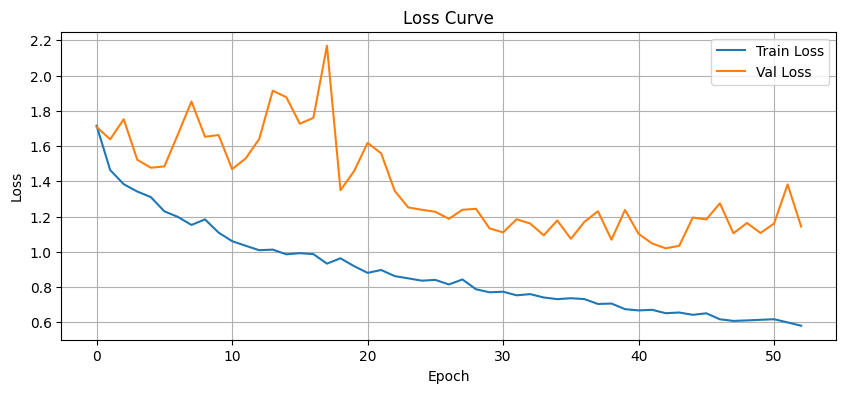

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import random
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, UpSampling2D, MaxPooling2D, Input, Concatenate, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split

# --- Dice Loss Function ---
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1, 3])
    y_pred_f = tf.reshape(y_pred, [-1, 3])
    intersection = tf.reduce_sum(y_true_f * y_pred_f, axis=0)
    denom = tf.reduce_sum(y_true_f, axis=0) + tf.reduce_sum(y_pred_f, axis=0)
    dice = (2. * intersection + smooth) / (denom + smooth)
    return 1 - tf.reduce_mean(dice)

def combined_loss(y_true, y_pred):
    return tf.keras.losses.categorical_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

# --- Dataset Loader ---
def load_dataset(dataset_path, img_size=(256, 256)):
    images, masks = [], []

    mask_dir = os.path.join(dataset_path, "mask_gabor")

    for filename in os.listdir(dataset_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')) and "_mask" not in filename:
            image_path = os.path.join(dataset_path, filename)
            base_name = os.path.splitext(filename)[0]
            mask_filename = base_name + "_gabor_mask.png"
            mask_path = os.path.join(mask_dir, mask_filename)

            if not os.path.exists(mask_path):
                print(f"⚠️ Skipping {filename}: no corresponding mask at {mask_path}")
                continue

            image = load_img(image_path, color_mode='grayscale', target_size=img_size)
            image = img_to_array(image) / 255.0
            images.append(image)

            mask = load_img(mask_path, color_mode='grayscale', target_size=img_size)
            mask = img_to_array(mask).astype(np.uint8).squeeze()
            mask = np.clip(mask, 0, 2)
            mask = to_categorical(mask, num_classes=3)
            masks.append(mask)

    return np.array(images), np.array(masks)

# --- Combine Multiple Datasets ---
def load_combined_dataset(dataset_paths, img_size=(256, 256)):
    all_images, all_masks = [], []

    for dataset_path in dataset_paths:
        print(f"📁 Loading from: {dataset_path}")
        mask_dir = os.path.join(dataset_path, "mask_gabor")

        for filename in os.listdir(dataset_path):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')) and "_mask" not in filename:
                image_path = os.path.join(dataset_path, filename)
                base_name = os.path.splitext(filename)[0]
                mask_filename = base_name + "_gabor_mask.png"
                mask_path = os.path.join(mask_dir, mask_filename)

                if not os.path.exists(mask_path):
                    print(f"⚠️ Skipping {filename}: no mask at {mask_path}")
                    continue

                image = load_img(image_path, color_mode='grayscale', target_size=img_size)
                image = img_to_array(image) / 255.0
                all_images.append(image)

                mask = load_img(mask_path, color_mode='grayscale', target_size=img_size)
                mask = img_to_array(mask).astype(np.uint8).squeeze()
                mask = np.clip(mask, 0, 2)
                mask = to_categorical(mask, num_classes=3)
                all_masks.append(mask)

    return np.array(all_images), np.array(all_masks)

# --- U-Net Architecture with Dropout & BatchNorm ---
def build_unet_model(input_shape=(256, 256, 1)):
    def conv_block(x, filters):
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.2)(x)
        x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = BatchNormalization()(x)
        return x

    inputs = Input(input_shape)

    c1 = conv_block(inputs, 64)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)

    u1 = UpSampling2D((2, 2))(c4)
    u1 = Concatenate()([u1, c3])
    c5 = conv_block(u1, 256)

    u2 = UpSampling2D((2, 2))(c5)
    u2 = Concatenate()([u2, c2])
    c6 = conv_block(u2, 128)

    u3 = UpSampling2D((2, 2))(c6)
    u3 = Concatenate()([u3, c1])
    c7 = conv_block(u3, 64)

    outputs = Conv2D(3, (1, 1), activation='softmax')(c7)

    model = Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                  loss=combined_loss,
                  metrics=['accuracy'])
    return model

# --- Training Function for Single Dataset ---
def train_unet_model(dataset_path, model_save_path="unet_model.h5", epochs=300, batch_size=4):
    print("🔄 Loading dataset...")
    images, masks = load_dataset(dataset_path)
    print(f"📦 Loaded {len(images)} images and {len(masks)} masks")

    if len(images) == 0 or len(masks) == 0:
        raise ValueError("❌ No images or masks loaded! Check paths and filenames.")

    X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.1, random_state=42)

    print("🔧 Building model...")
    model = build_unet_model(input_shape=(256, 256, 1))

    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')

    print("🚀 Training model...")
    history = model.fit(X_train, y_train,
                        validation_data=(X_val, y_val),
                        epochs=epochs,
                        batch_size=batch_size,
                        callbacks=[early_stop, checkpoint])

    print(f"✅ Model saved to {model_save_path}")

    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# --- Training Function for Multiple Datasets ---
def train_unet_model_on_multiple_datasets(dataset_paths, model_save_path="unet_model.h5", epochs=300, batch_size=4):
    print("🔄 Loading combined dataset...")
    images, masks = load_combined_dataset(dataset_paths)
    print(f"📦 Loaded total {len(images)} images and {len(masks)} masks")

    if len(images) == 0 or len(masks) == 0:
        raise ValueError("❌ No images or masks loaded! Check dataset paths and filenames.")

    X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.1, random_state=42)

    print("🔧 Building model...")
    model = build_unet_model(input_shape=(256, 256, 1))

    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')

    print("🚀 Training model...")
    history = model.fit(X_train, y_train,
                        validation_data=(X_val, y_val),
                        epochs=epochs,
                        batch_size=batch_size,
                        callbacks=[early_stop, checkpoint])

    print(f"✅ Model saved to {model_save_path}")

    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# --- Run Training ---
if __name__ == "__main__":
    # For single dataset training
    # dataset_path = "/content/drive/MyDrive/001"
    # model_save_path = "/content/drive/MyDrive/unet_model_3class_best.h5"
    # train_unet_model(dataset_path, model_save_path)

    # For multi-dataset training
    dataset_paths = [
        "/content/drive/MyDrive/001",
        "/content/drive/MyDrive/002",
        "/content/drive/MyDrive/003",
        "/content/drive/MyDrive/004"
    ]
    model_save_path = "/content/drive/MyDrive/unet_model_3class_all_datasets_best.h5"
    train_unet_model_on_multiple_datasets(dataset_paths, model_save_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step
📄 005_F_R_1.JPG — IoU: 0.3172, Dice: 0.4146


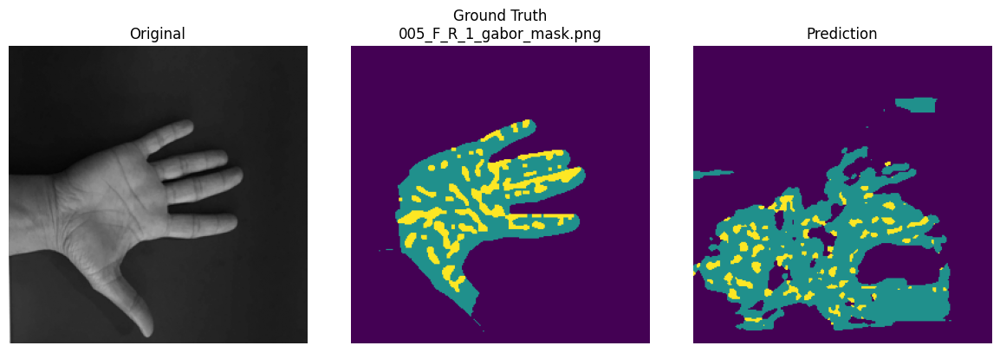

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
📄 005_F_L_36.JPG — IoU: 0.2342, Dice: 0.3305


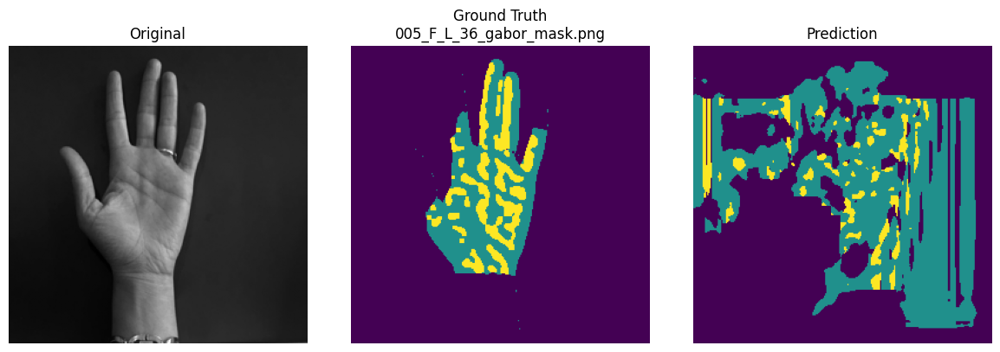

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_F_L_34.JPG — IoU: 0.2318, Dice: 0.2902


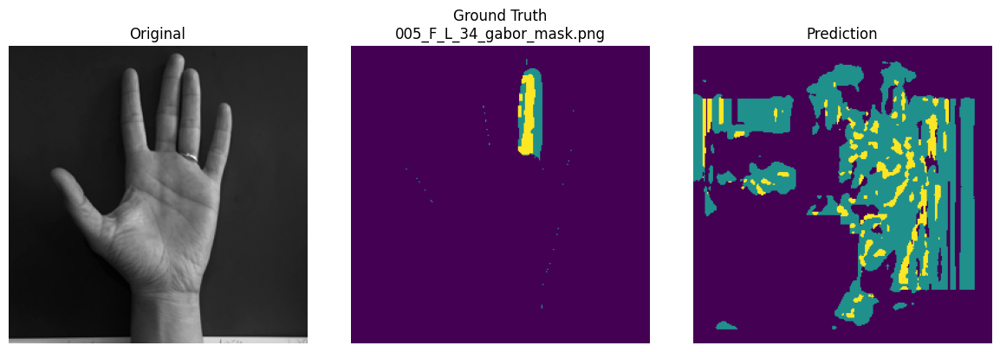

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_F_L_37.JPG — IoU: 0.2265, Dice: 0.3240


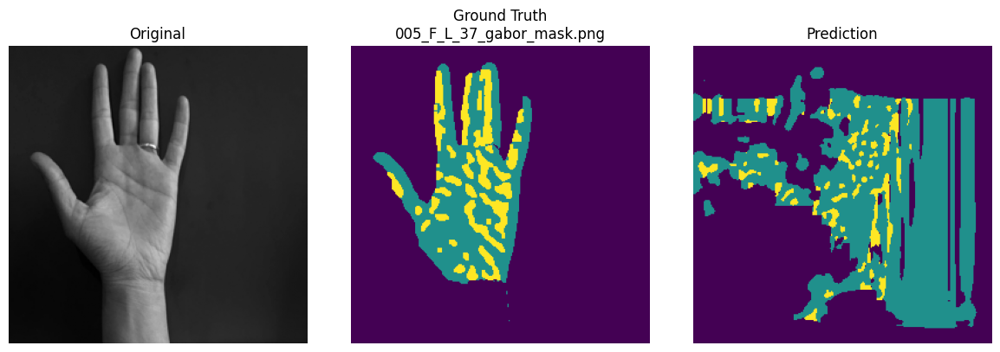

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
📄 005_F_R_2.JPG — IoU: 0.3227, Dice: 0.4371


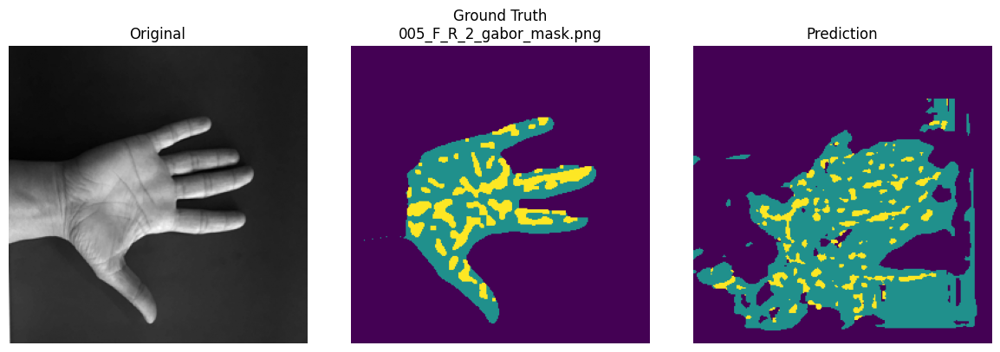

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
📄 005_F_R_0.JPG — IoU: 0.3101, Dice: 0.4140


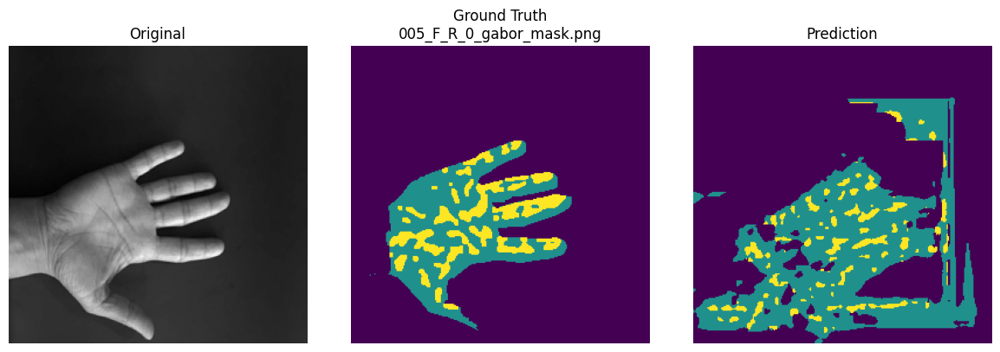

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
📄 005_F_L_39.JPG — IoU: 0.1953, Dice: 0.2550


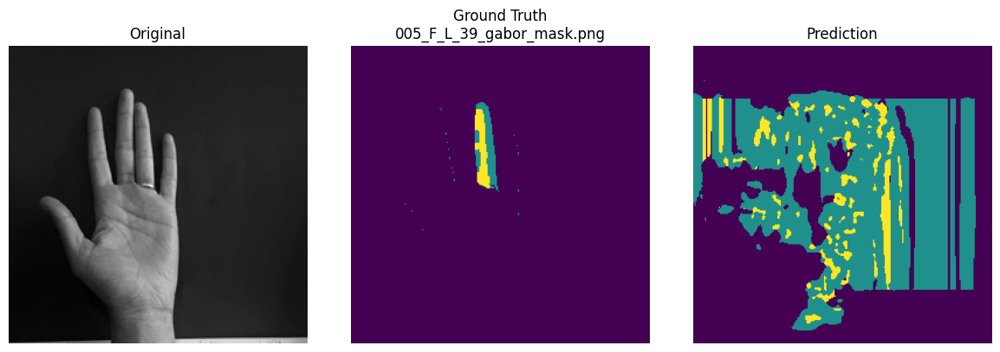

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
📄 005_F_L_38.JPG — IoU: 0.2448, Dice: 0.3432


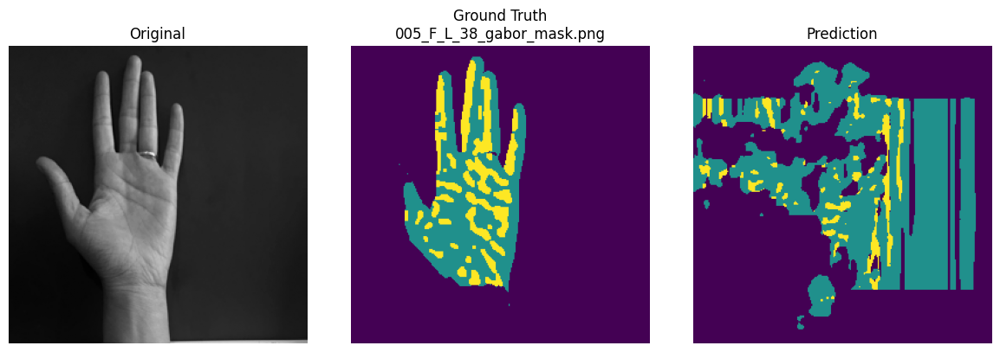

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
📄 005_F_L_35.JPG — IoU: 0.2256, Dice: 0.2845


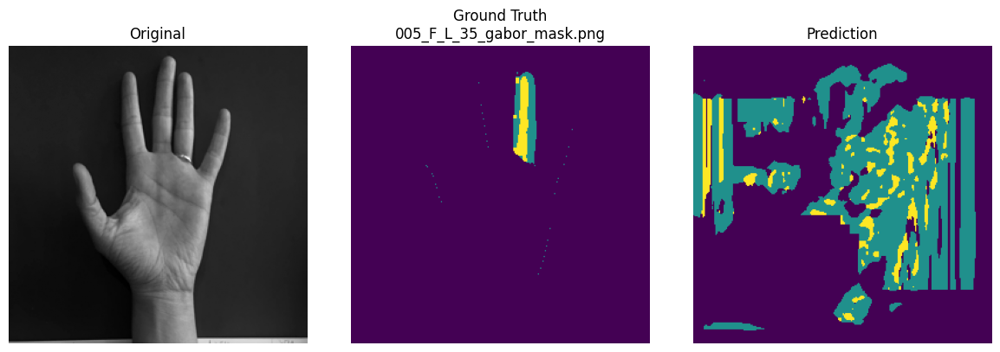

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
📄 005_F_L_32.JPG — IoU: 0.1817, Dice: 0.2381


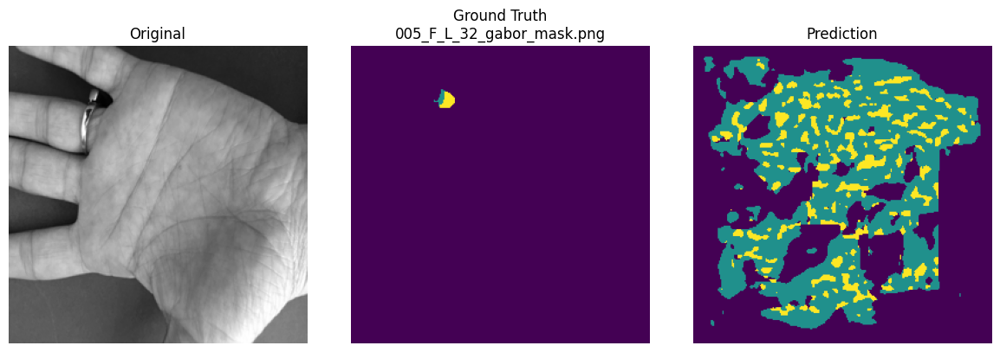

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
📄 005_F_L_30.JPG — IoU: 0.3445, Dice: 0.4618


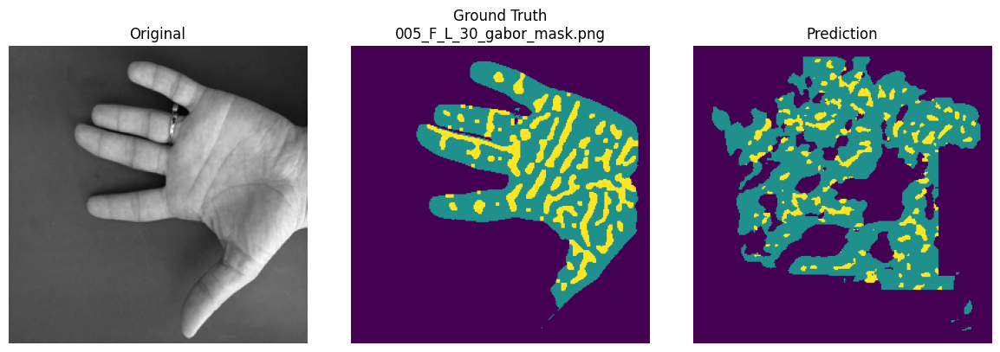

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
📄 005_F_L_31.JPG — IoU: 0.1818, Dice: 0.2381


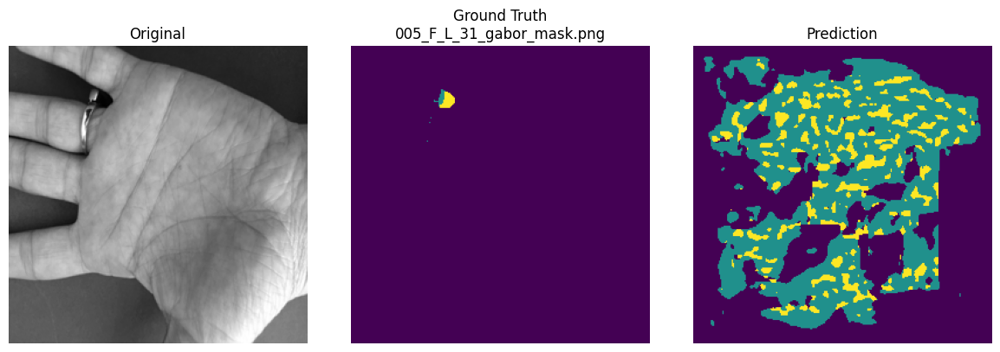

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
📄 005_F_R_7.JPG — IoU: 0.3392, Dice: 0.4576


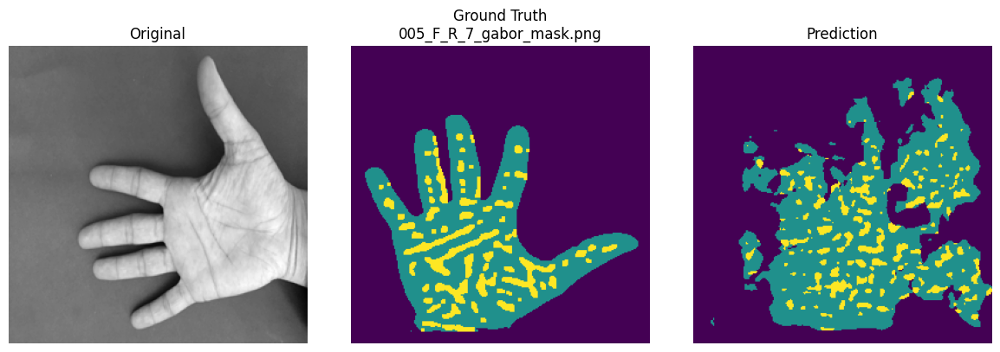

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
📄 005_F_R_5.JPG — IoU: 0.3532, Dice: 0.4721


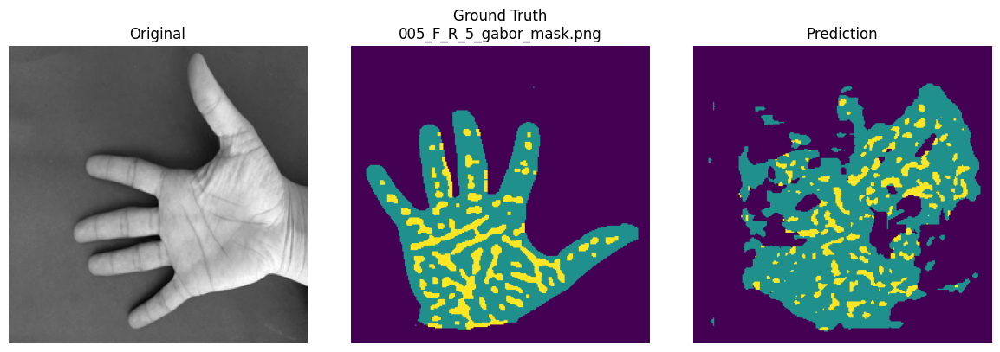

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
📄 005_F_R_6.JPG — IoU: 0.3311, Dice: 0.4694


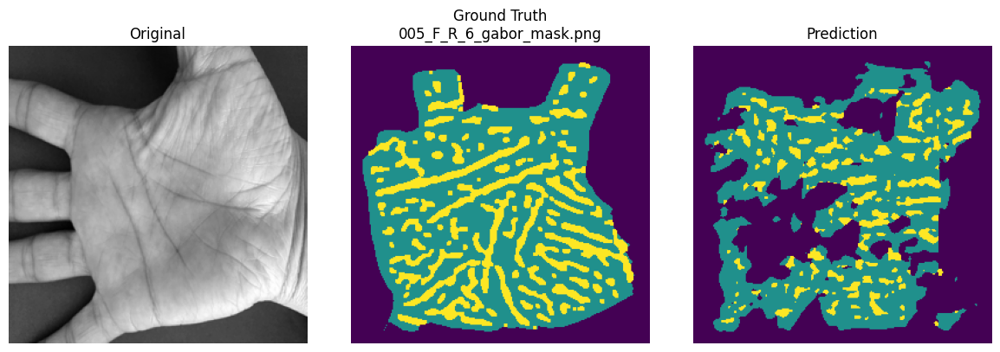

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
📄 005_F_R_4.JPG — IoU: 0.3802, Dice: 0.5166


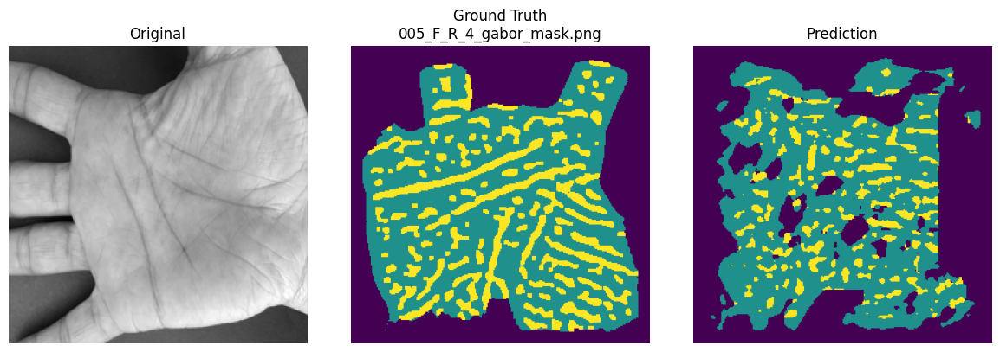

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
📄 005_F_R_3.JPG — IoU: 0.3943, Dice: 0.5177


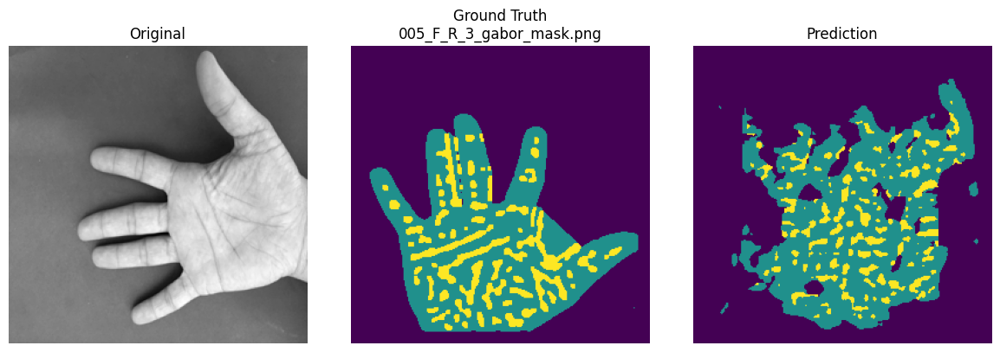

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
📄 005_F_L_33.JPG — IoU: 0.3331, Dice: 0.4588


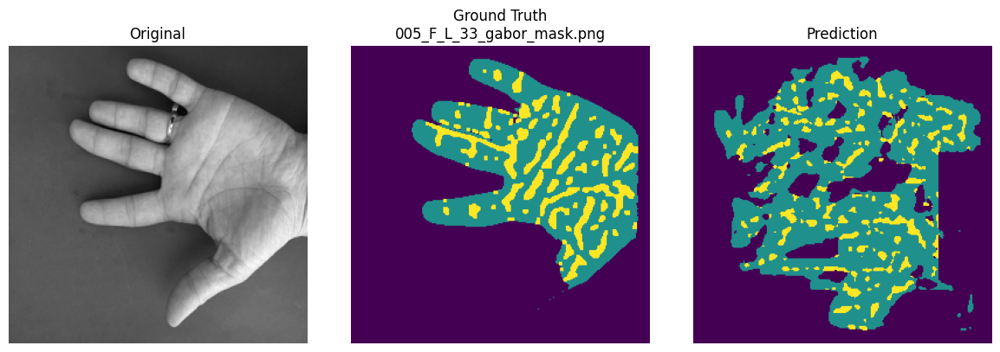

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
📄 005_F_R_9.JPG — IoU: 0.3565, Dice: 0.4797


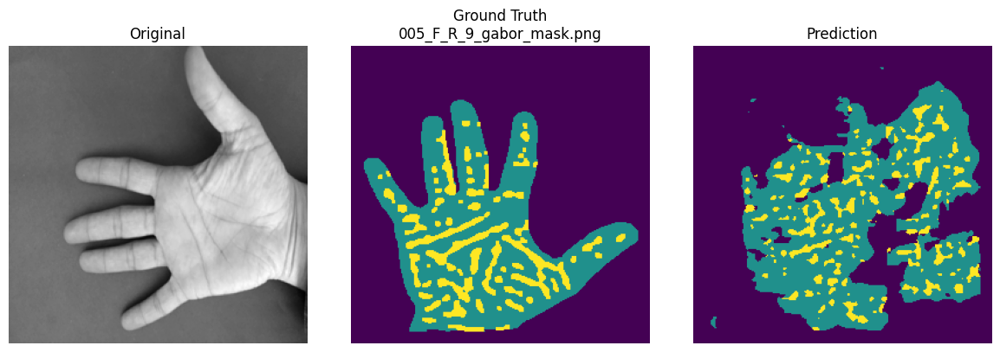

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
📄 005_F_R_8.JPG — IoU: 0.3220, Dice: 0.4579


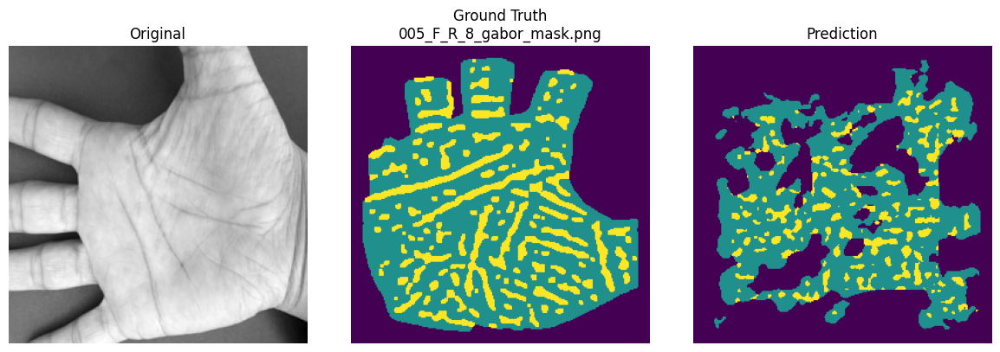

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
📄 005_S_L_20.JPG — IoU: 0.2882, Dice: 0.4118


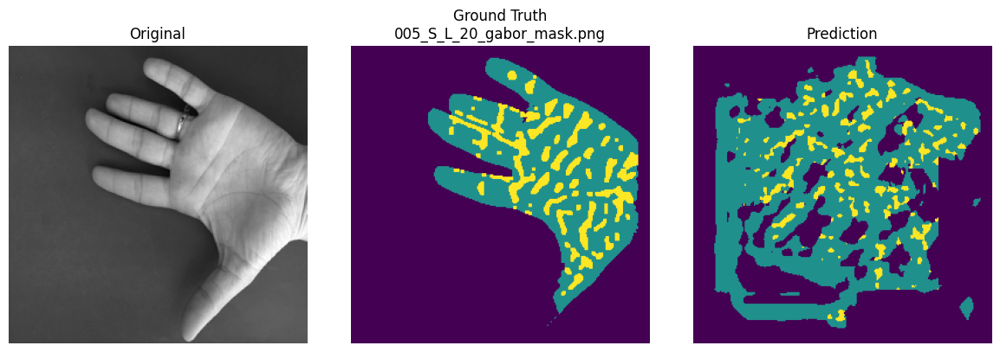

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_S_L_22.JPG — IoU: 0.3137, Dice: 0.4519


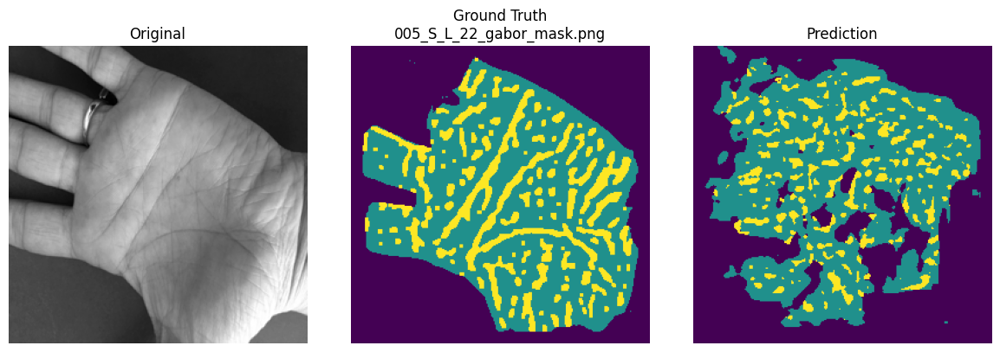

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
📄 005_S_L_21.JPG — IoU: 0.3138, Dice: 0.4520


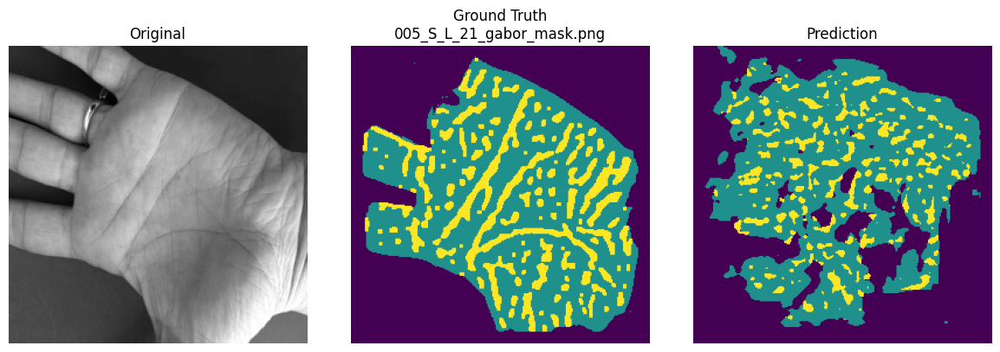

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
📄 005_S_L_27.JPG — IoU: 0.3389, Dice: 0.4584


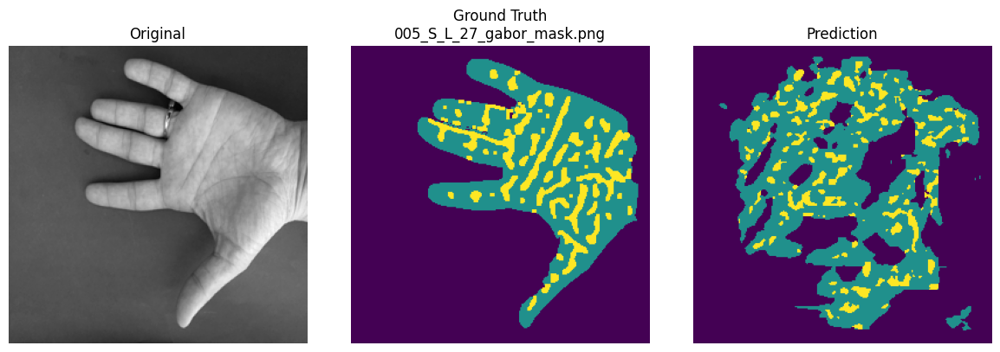

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
📄 005_S_L_25.JPG — IoU: 0.3192, Dice: 0.4574


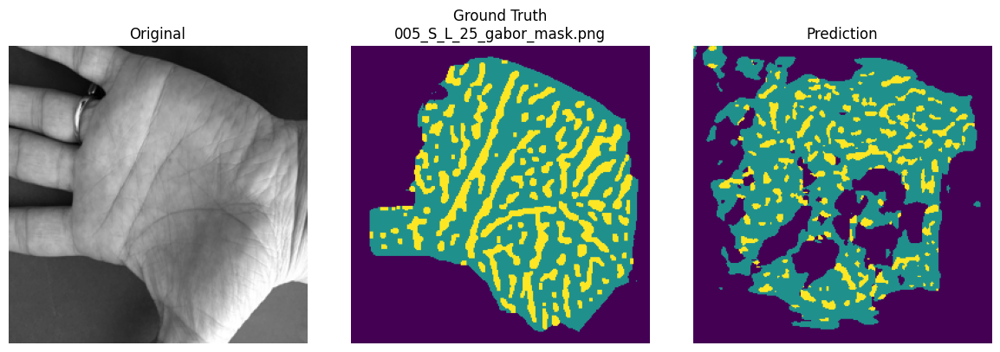

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_S_L_26.JPG — IoU: 0.3535, Dice: 0.4692


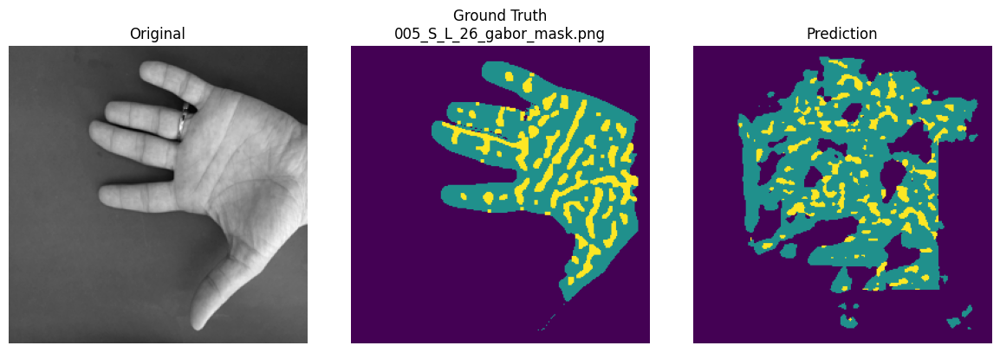

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_S_L_23.JPG — IoU: 0.3188, Dice: 0.4361


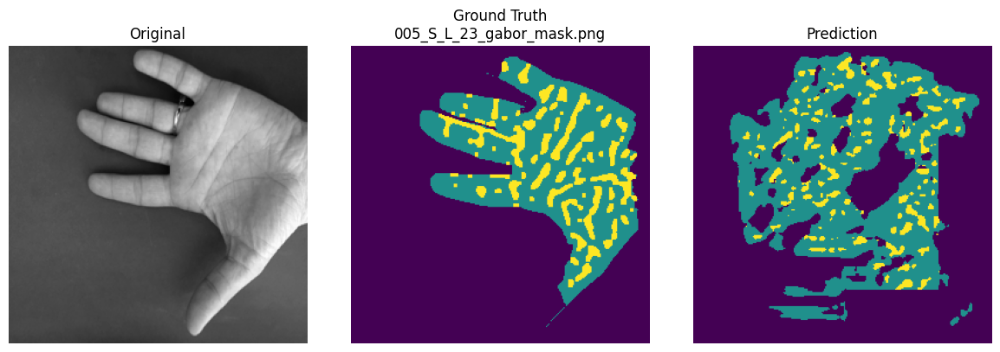

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
📄 005_S_L_24.JPG — IoU: 0.3192, Dice: 0.4574


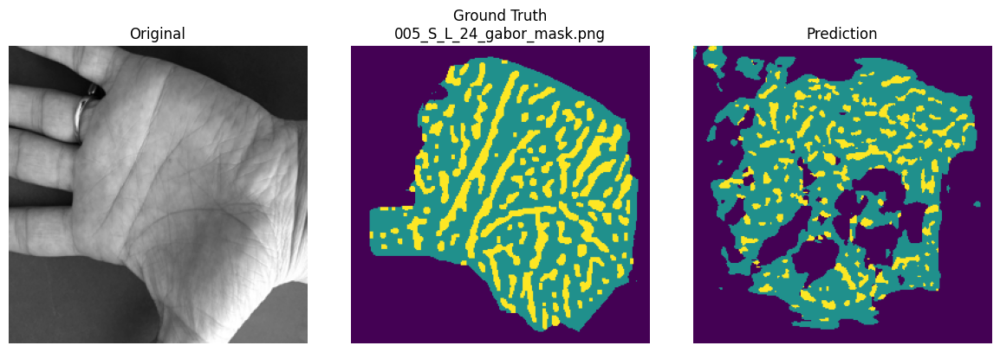

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
📄 005_S_R_12.JPG — IoU: 0.3591, Dice: 0.4960


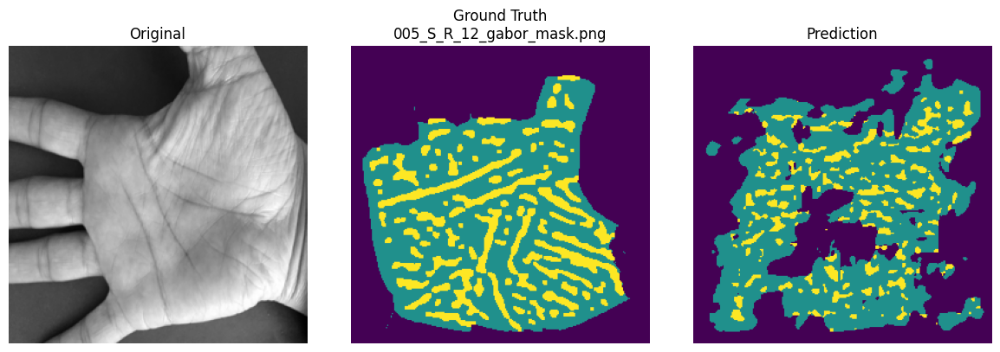

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_S_R_11.JPG — IoU: 0.3264, Dice: 0.4577


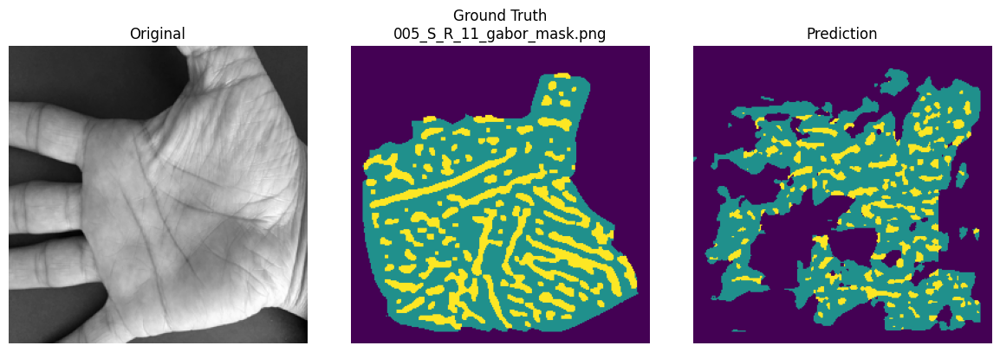

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
📄 005_S_L_29.JPG — IoU: 0.3274, Dice: 0.4431


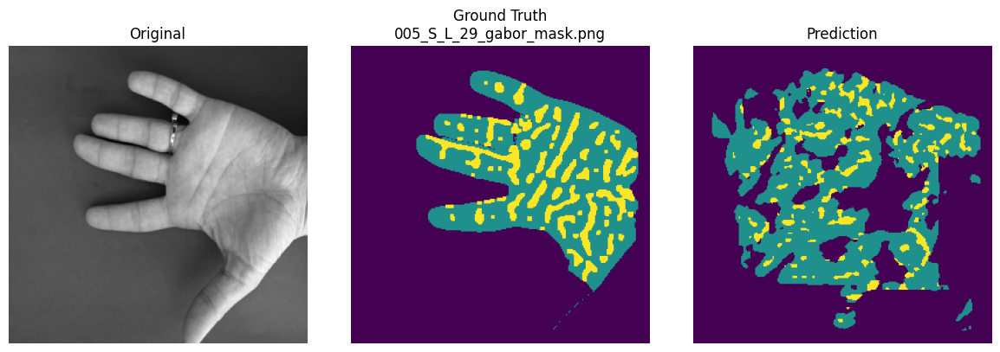

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
📄 005_S_R_10.JPG — IoU: 0.3462, Dice: 0.4734


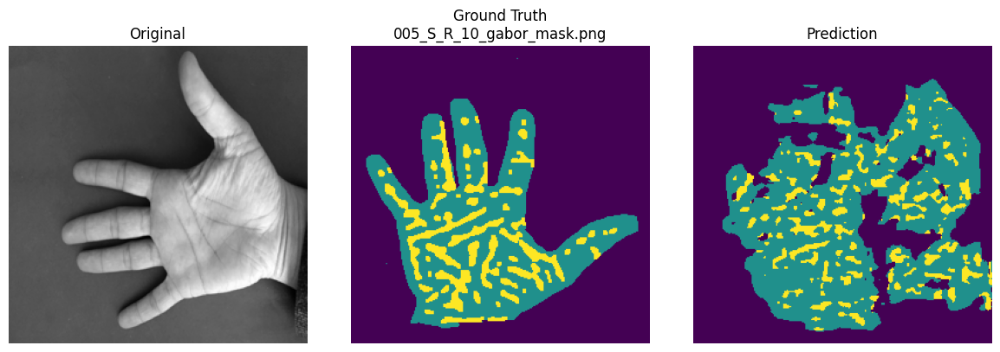

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
📄 005_S_L_28.JPG — IoU: 0.3373, Dice: 0.4721


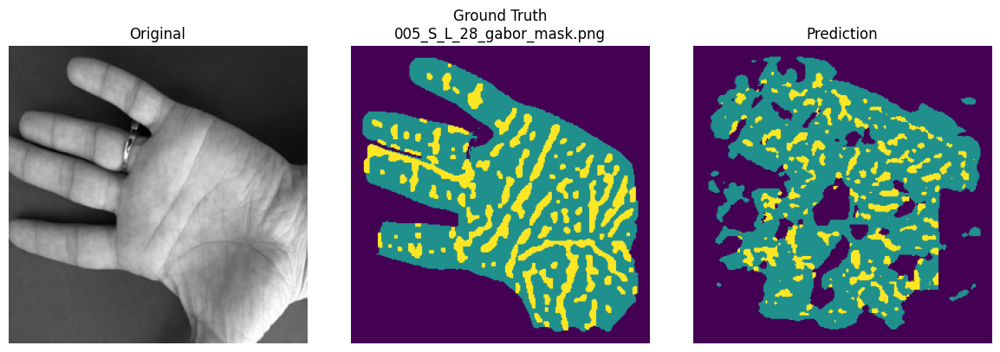

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
📄 005_S_R_17.JPG — IoU: 0.3263, Dice: 0.4536


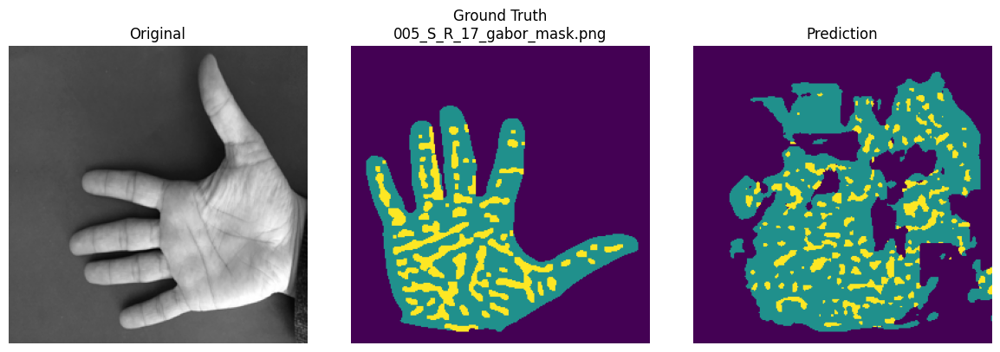

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
📄 005_S_R_19.JPG — IoU: 0.1746, Dice: 0.2293


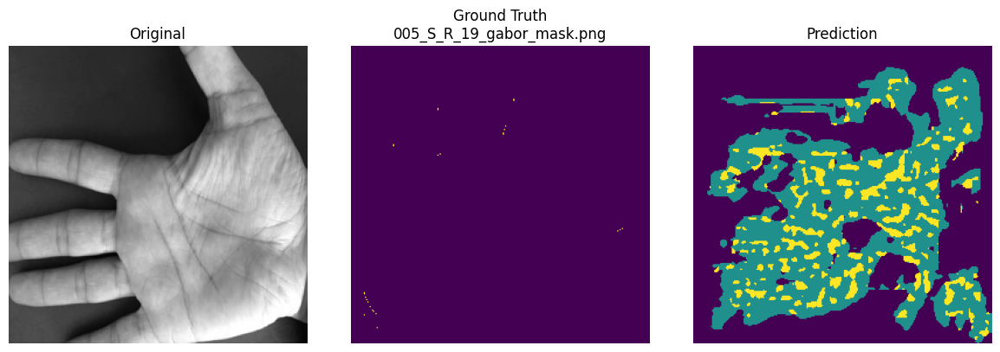

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
📄 005_S_R_14.JPG — IoU: 0.3253, Dice: 0.4504


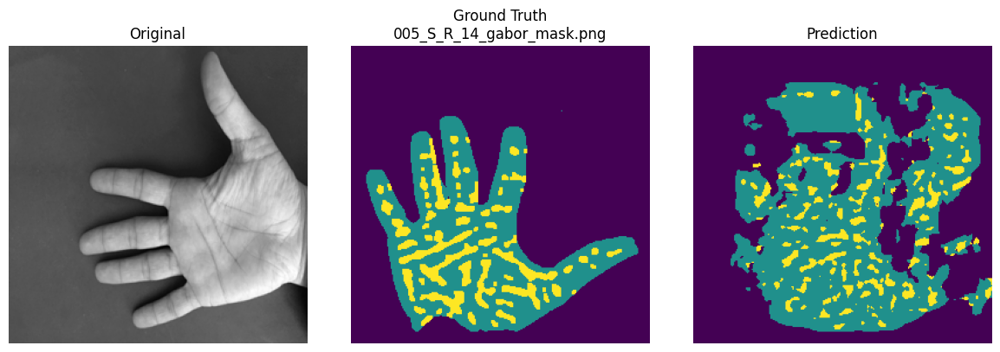

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
📄 005_S_R_16.JPG — IoU: 0.2873, Dice: 0.4110


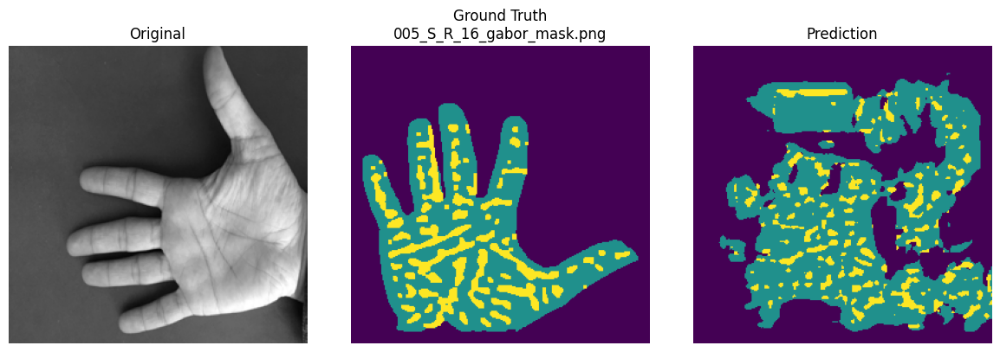

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
📄 005_S_R_15.JPG — IoU: 0.1959, Dice: 0.2468


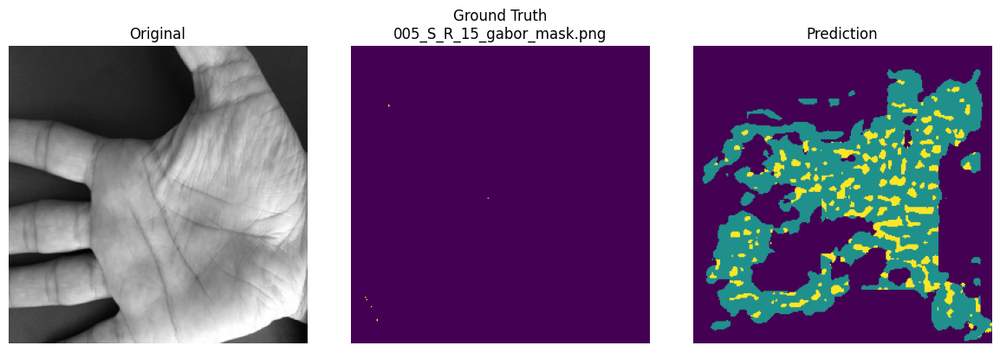

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
📄 005_S_R_13.JPG — IoU: 0.3251, Dice: 0.4524


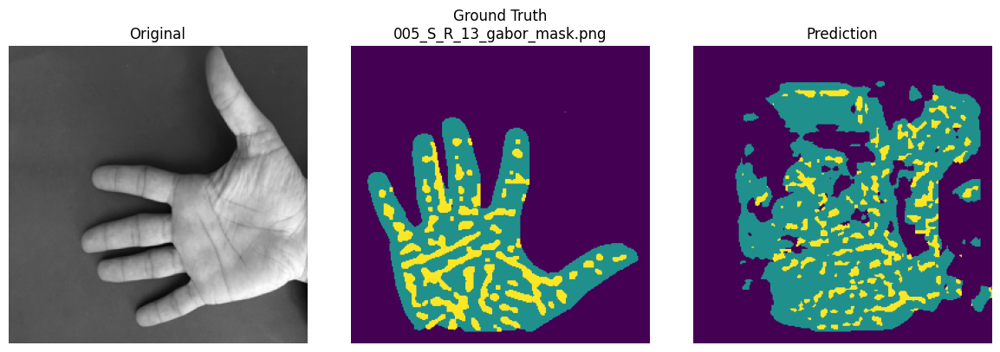

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
📄 005_S_R_18.JPG — IoU: 0.3008, Dice: 0.4271


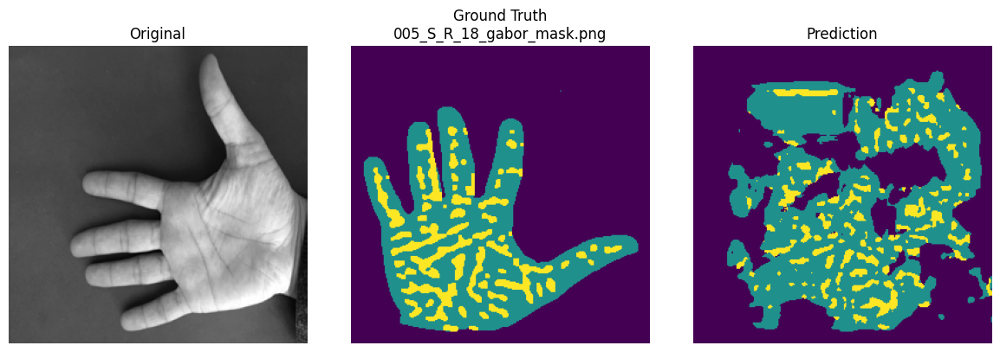


📊 Final Evaluation over all test images:
✅ Mean IoU:  0.3006
✅ Mean Dice: 0.4117


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.models import load_model
from sklearn.metrics import jaccard_score, f1_score

# --- Paths ---
model_path = "/content/drive/MyDrive/unet_model_3class.h5"
test_image_dir = "/content/drive/MyDrive/005"
mask_dir = "/content/drive/MyDrive/005/mask_gabor"

# --- Parameters ---
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 1  # Grayscale

# --- Load Model ---
model = load_model(model_path)

# --- Get all test images ---
test_images = [f for f in os.listdir(test_image_dir) if f.lower().endswith(".jpg")]

# --- Track metrics ---
iou_scores = []
dice_scores = []

# --- Prediction & Evaluation ---
for filename in test_images:
    # Load original image
    img_path = os.path.join(test_image_dir, filename)
    img = Image.open(img_path).convert('L')
    img_resized = img.resize((IMG_WIDTH, IMG_HEIGHT))
    input_img = np.expand_dims(np.array(img_resized), axis=(0, -1)) / 255.0  # Shape: (1, 256, 256, 1)

    # Predict
    pred_mask = model.predict(input_img)
    predicted_mask = np.argmax(pred_mask[0], axis=-1).astype(np.uint8)  # Shape: (256, 256)

    # Construct ground truth mask path
    base_name = os.path.splitext(filename)[0]
    mask_filename = base_name + "_gabor_mask.png"
    mask_path = os.path.join(mask_dir, mask_filename)

    if not os.path.exists(mask_path):
        print(f"❌ Mask not found for {filename}")
        continue

    # Load ground truth mask
    gt_mask = Image.open(mask_path).convert('L').resize((IMG_WIDTH, IMG_HEIGHT))
    gt_mask_np = np.array(gt_mask)

    # Normalize ground truth mask to class labels (0, 1, 2)
    unique_vals = np.unique(gt_mask_np)
    if len(unique_vals) > 3:
        gt_mask_np = (gt_mask_np / 85).astype(np.uint8)  # if 0, 85, 170 -> convert to 0,1,2

    # Flatten for metrics
    y_true = gt_mask_np.flatten()
    y_pred = predicted_mask.flatten()

    # Compute metrics
    iou = jaccard_score(y_true, y_pred, average='macro', zero_division=0)
    dice = f1_score(y_true, y_pred, average='macro', zero_division=0)

    iou_scores.append(iou)
    dice_scores.append(dice)

    # Print metrics
    print(f"📄 {filename} — IoU: {iou:.4f}, Dice: {dice:.4f}")

    # Show images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(img_resized, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title(f"Ground Truth\n{mask_filename}")
    plt.imshow(gt_mask_np, cmap='viridis')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Prediction")
    plt.imshow(predicted_mask, cmap='viridis')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# --- Final average scores ---
if iou_scores and dice_scores:
    print("\n📊 Final Evaluation over all test images:")
    print(f"✅ Mean IoU:  {np.mean(iou_scores):.4f}")
    print(f"✅ Mean Dice: {np.mean(dice_scores):.4f}")
else:
    print("⚠️ No evaluation done — check mask availability.")


In [ ]:
import cv2
import numpy as np
import os
from glob import glob
from tqdm import tqdm

input_path = "/content/drive/MyDrive/001"  # Path to original fingerprints
output_path = "/content/drive/MyDrive/001_degraded"

os.makedirs(output_path, exist_ok=True)

def degrade_image(img):
    # Apply Gaussian Blur
    blurred = cv2.GaussianBlur(img, (5, 5), 0)

    # Add Gaussian noise
    noise = np.random.normal(0, 10, img.shape).astype(np.uint8)
    noisy = cv2.add(blurred, noise)

    return noisy

# Process all .JPG files
image_paths = sorted(glob(os.path.join(input_path, "*.JPG")))

for img_path in tqdm(image_paths):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (256, 256))  # Resize for consistency
    degraded = degrade_image(img)

    # Save with same name
    filename = os.path.basename(img_path)
    cv2.imwrite(os.path.join(output_path, filename), degraded)


100%|██████████| 40/40 [00:05<00:00,  6.69it/s]


In [ ]:
# Load necessary libraries
#enhancing
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import os
import cv2
import numpy as np

# Load and preprocess degraded and original clean images
def load_images(degraded_path, clean_path, image_size=(256, 256)):
    degraded_images, clean_images = [], []
    for fname in os.listdir(degraded_path):
        degraded = cv2.imread(os.path.join(degraded_path, fname), cv2.IMREAD_GRAYSCALE)
        clean = cv2.imread(os.path.join(clean_path, fname), cv2.IMREAD_GRAYSCALE)
        if degraded is not None and clean is not None:
            degraded = cv2.resize(degraded, image_size) / 255.0
            clean = cv2.resize(clean, image_size) / 255.0
            degraded_images.append(degraded[..., np.newaxis])
            clean_images.append(clean[..., np.newaxis])
    return np.array(degraded_images), np.array(clean_images)

degraded_path = "/content/drive/MyDrive/001_degraded"
clean_path = "/content/drive/MyDrive/001"
X_train, Y_train = load_images(degraded_path, clean_path)

# Simple U-Net Generator
def unet_model(input_shape):
    inputs = Input(shape=input_shape)

    # Encoder
    c1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    p1 = MaxPooling2D()(c1)
    c2 = Conv2D(128, 3, activation='relu', padding='same')(p1)
    p2 = MaxPooling2D()(c2)

    # Bottleneck
    b = Conv2D(256, 3, activation='relu', padding='same')(p2)

    # Decoder
    u1 = UpSampling2D()(b)
    concat1 = Concatenate()([u1, c2])
    c3 = Conv2D(128, 3, activation='relu', padding='same')(concat1)

    u2 = UpSampling2D()(c3)
    concat2 = Concatenate()([u2, c1])
    c4 = Conv2D(64, 3, activation='relu', padding='same')(concat2)

    outputs = Conv2D(1, 1, activation='sigmoid')(c4)
    return Model(inputs, outputs)

model = unet_model((256, 256, 1))
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
model.fit(X_train, Y_train, batch_size=4, epochs=100)

# Save the model
model.save("/content/drive/MyDrive/enhancer_model.h5")


Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.0337 - mae: 0.1543
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0073 - mae: 0.0653
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0048 - mae: 0.0510
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0035 - mae: 0.0402
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0028 - mae: 0.0355
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0024 - mae: 0.0323
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0022 - mae: 0.0305
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0020 - mae: 0.0289
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0019 - mae: 0.0282
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0019 - mae: 0.0288
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0018 - mae: 0.0274
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0017 - mae: 0.0271
Epoch 13/100
10/10 ━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 725ms/step


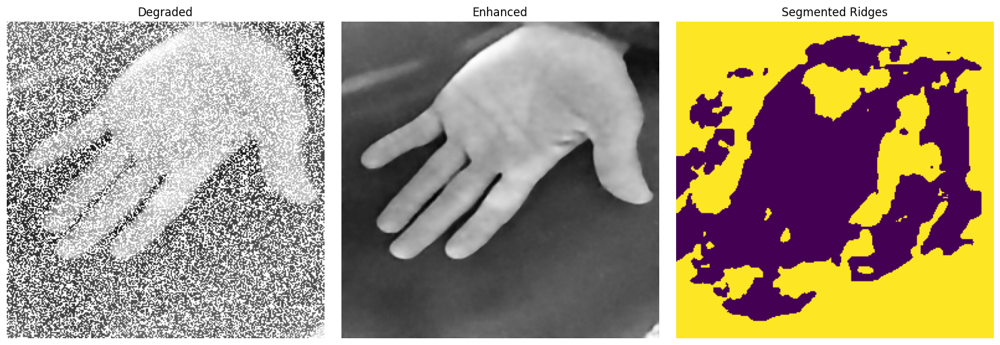

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import MeanAbsoluteError

# Load models with custom loss/metrics
enhancer_model = load_model(
    "/content/drive/MyDrive/enhancer_model.h5",
    custom_objects={
        'mse': MeanSquaredError(),
        'mae': MeanAbsoluteError()
    }
)

segmentation_model = load_model("/content/drive/MyDrive/unet_model_3class.h5")

# Image preprocessing function
def preprocess_img(path, image_size=(256, 256)):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, image_size) / 255.0
    img = img.astype(np.float32)
    return img[np.newaxis, ..., np.newaxis]  # shape: (1, H, W, 1)

# Load degraded image
img_path = "/content/drive/MyDrive/001_degraded/001_F_L_34.JPG"
degraded_img = preprocess_img(img_path)

# Step 1: Enhance
enhanced_img = enhancer_model.predict(degraded_img)

# Optional: Clip enhanced output if needed
enhanced_img = np.clip(enhanced_img, 0, 1)

# Step 2: Segment ridges
segmentation_mask = segmentation_model.predict(enhanced_img)

# Optional postprocessing for binary segmentation
# If the segmentation is binary (ridges vs background)
segmentation_mask = (segmentation_mask > 0.5).astype(np.uint8)

# Visualize the results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(degraded_img[0, ..., 0], cmap='gray')
plt.title("Degraded")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(enhanced_img[0, ..., 0], cmap='gray')
plt.title("Enhanced")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(segmentation_mask[0, ..., 0])
plt.title("Segmented Ridges")
plt.axis("off")

plt.tight_layout()
plt.show()
